In [22]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO
import numpy as np
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
from PIL import ImageColor

import time

In [13]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

In [14]:
model = hub.load(module_handle)

In [15]:
detector = model.signatures['default']

In [16]:
def display_image(image):

    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)

def font_getsize(font, text):

    left, top, right, bottom = font.getbbox(text)

    return right - left, bottom - top


def download_and_resize_image(url, new_width=256, new_height=256, display=False):

    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.Resampling.LANCZOS)
    pil_image_rgb = pil_image.convert("RGB")
    pil_image_rgb.save(filename, format="JPEG", quality=90)

    print("Resim İndiriliyor %s." % filename)

    if display:
        display_image(pil_image)


    return filename

Resim İndiriliyor /tmp/tmpwsmur_po.jpg.


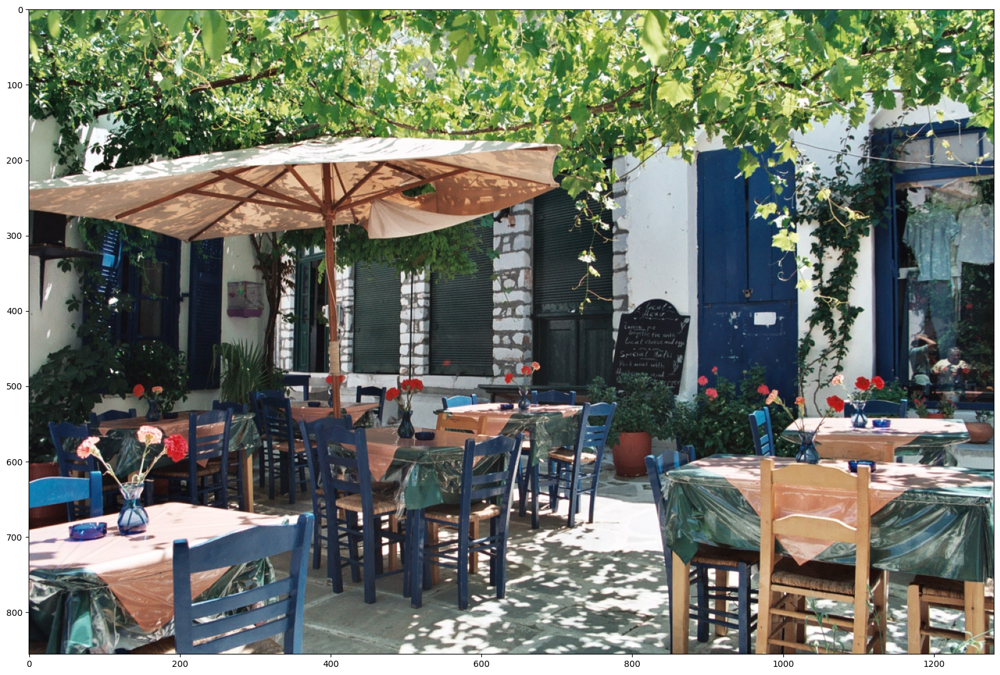

In [17]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  #Rasgele bir İmage alındı Web'den.
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True) # İstenine formata getirildi.

In [18]:
def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):



    draw = ImageDraw.Draw(image) #Nesne Oluşuruldu.
    im_width, im_height = image.size #Nesnenin genişliği ve uzunluğu alındı.


    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height) # 1 ile 0 arasına dönüştürüldü.


    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color) #Sınır Kutuları çizildi.

    display_str_heights = [font_getsize(font,ds)[1] for ds in display_str_list] #Her Metinin Yüksekliği Hesaplandı.
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height: # Metin nereye yazılacağına karar verildi.
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height
    for display_str in display_str_list[::-1]: #Metinin Genişliği ve Yüksekliği Hesaplandı.
        text_width, text_height = font_getsize(font, display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                        (left + text_width, text_bottom)],
                       fill=color) #Metnin arkasına renkli bir kutu çizildi.
        draw.text((left + margin, text_bottom - text_height - margin),
                  display_str,
                  fill="black",
                  font=font) #Kutunun içine sınıf ismi ve yüzde değeri yazıldı.
        text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):

    colors = list(ImageColor.colormap.values()) #Renk listesini oluşturur. Her kutu farklı bir renk alabilir.

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default() #Özel bir font yüklenmeye çalışılır, eğer font bulunamazsa varsayılan font kullanılır.

    for i in range(min(boxes.shape[0], max_boxes)):# Toplam Kutu Sayısı Alınır ve sınıra kadar döngü çalışır.

        if scores[i] >= min_score: #Kutunun Çizilmesi için minimum scoreden büyük olmalıdır.
            ymin, xmin, ymax, xmax = tuple(boxes[i]) #Mevcut nesnenin sınır kutusu koordinatları alınır.
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                         int(100 * scores[i])) #Sınıf ismi ve doğruluk skoru içeren bir metin oluşturulur.
            color = colors[hash(class_names[i]) % len(colors)] #Her nesneye rastgele bir renk atanır.
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB") #Numpydan PIL formatına çevirildi.

            draw_bounding_box_on_image(image_pil,
                                       ymin,
                                       xmin,
                                       ymax,
                                       xmax,
                                       color,
                                       font,
                                       display_str_list=[display_str])
            np.copyto(image, np.array(image_pil)) #Güncellenen görünütü numpy formatına çevirildi.

    return image

In [20]:
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img


def run_detector(detector, path):
    img = load_img(path)
    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()
    result = {key:value.numpy() for key,value in result.items()}
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)
    image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])
    display_image(image_with_boxes)

Found 100 objects.
Inference time:  38.14916753768921


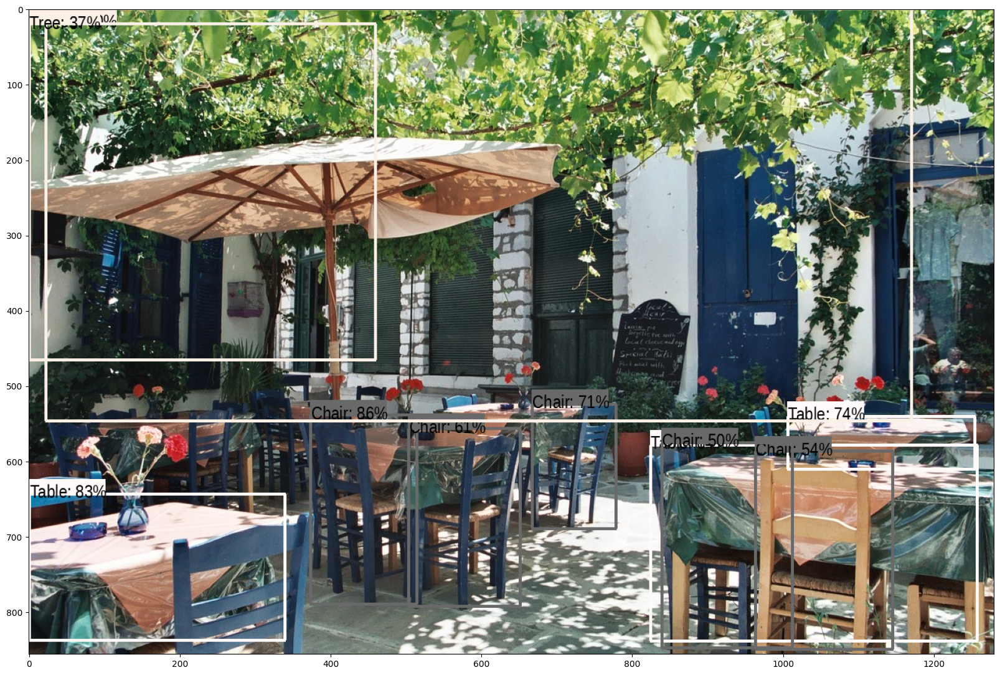

In [24]:
run_detector(detector, downloaded_image_path)

In [23]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://www.devrekpostasi.net/wp-content/uploads/2024/07/ibb-trafik-2160564.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://blog.supersigortam.com/wp-content/uploads/2023/01/trafik-cezasi-icin-arac-durduran-polis.webp",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 500, 480)
    run_detector(detector, image_path)
    end_time = time.time()
    print("Inference time:",end_time-start_time)

Resim İndiriliyor /tmp/tmps8sng87k.jpg.
Found 100 objects.
Inference time:  39.83799886703491
Inference time: 41.80346465110779


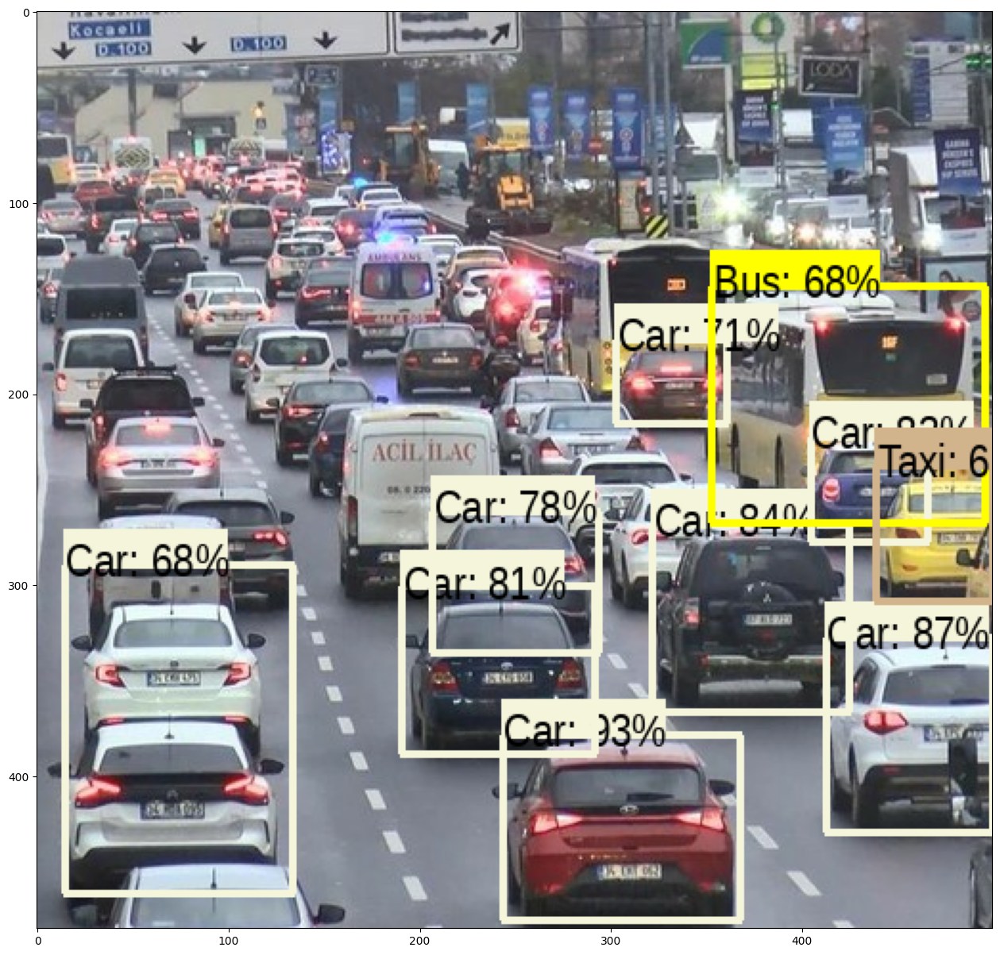

In [25]:
detect_img(image_urls[0])

Resim İndiriliyor /tmp/tmppy5rzozf.jpg.
Found 100 objects.
Inference time:  32.37591075897217
Inference time: 34.49651885032654


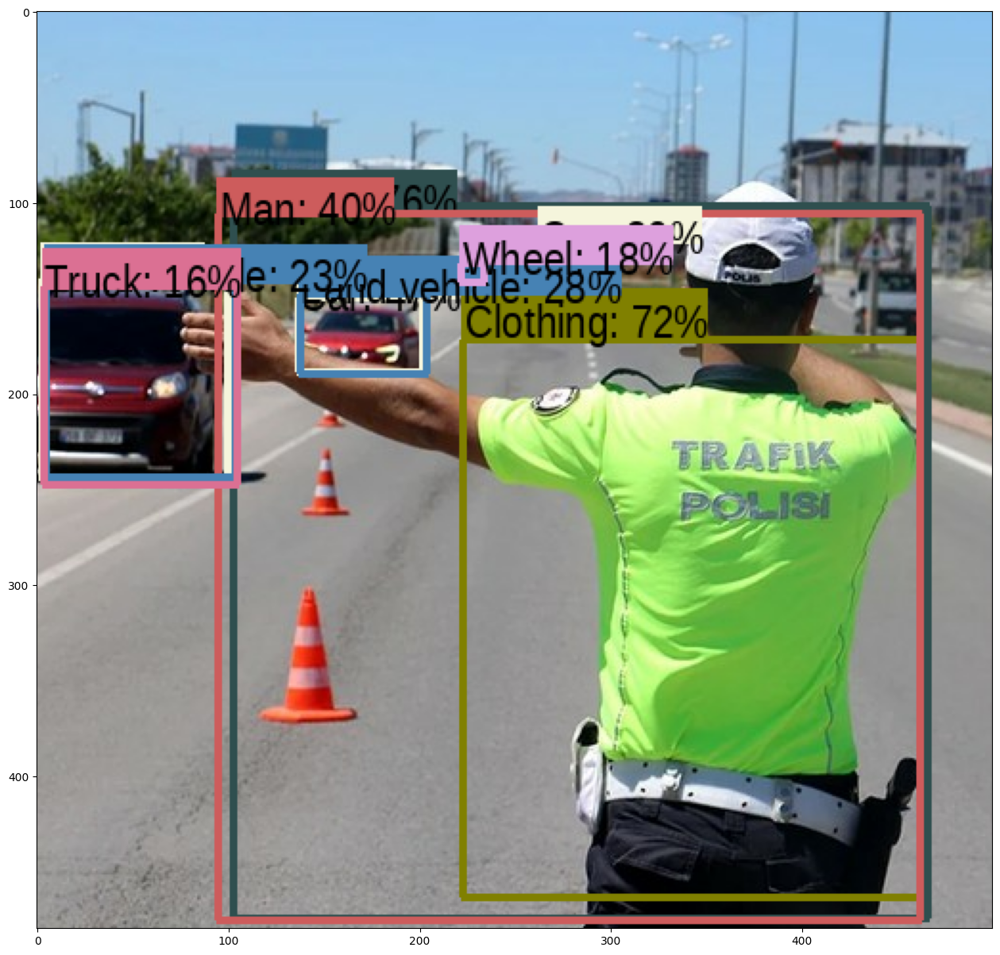

In [27]:
detect_img(image_urls[1])

Resim İndiriliyor /tmp/tmpi9ey9l6y.jpg.
Found 100 objects.
Inference time:  32.58964133262634
Inference time: 33.13333082199097


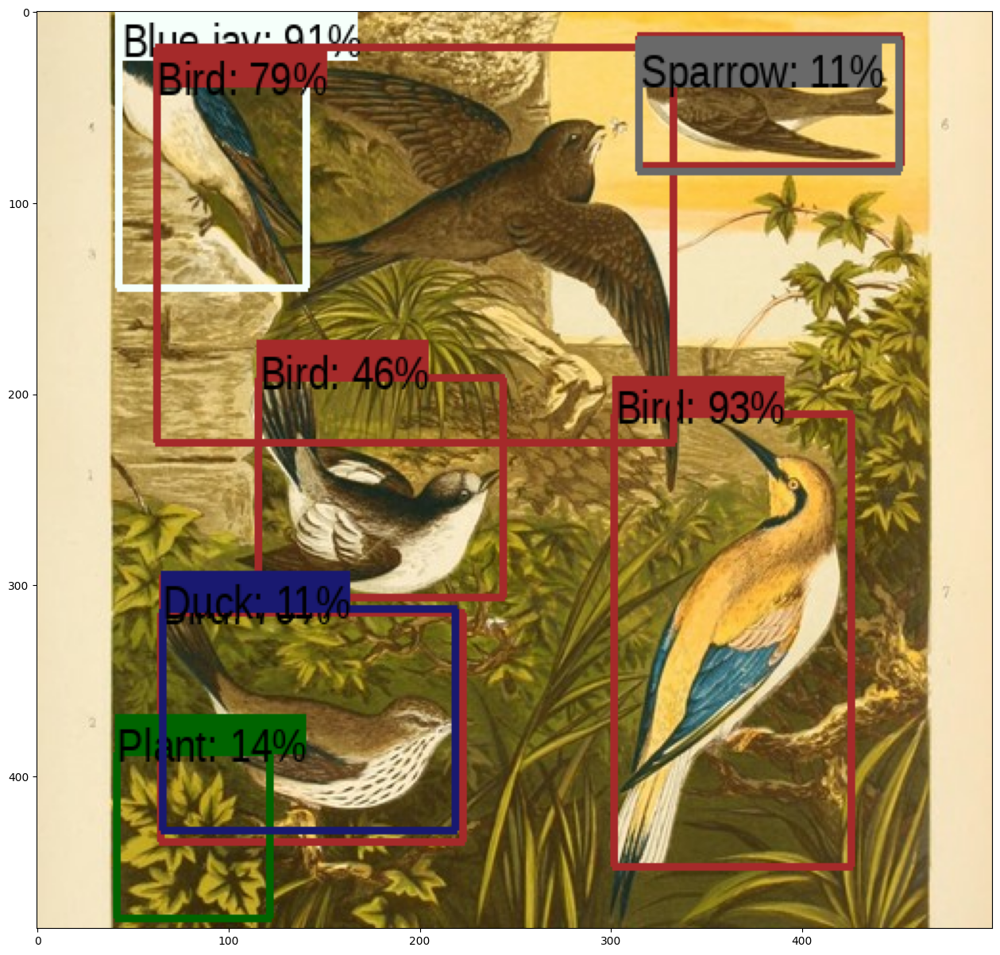

In [28]:
detect_img(image_urls[2])